### Notebook Contents

In accordance with procedure discussed during 6/4/2024 meeting.

    Exposure ≡ Weighted FF Sum = 1*(# parcels w/ FF=1) + 2*(# parcels w/ FF=2) + ... + 10*(# parcels w/ FF=10)
    Ascending Sort
    Total, White, and Nonwhite
    
    All Coastal States AND All Coastal Counties containing 3 or more Census Tracts
        Lorenz Curves
        Area under Lorenz Curves
        Traditional Gini Index Calculation
        
    Additional analysis also performed for all coastal states only considering Census Tracts within their coastal counties

## Coastal States

States (including D.C.) in the contiguous U.S. containing coastal counties according to NOAA Fisheries.

    https://www.fisheries.noaa.gov/inport/item/66112
    Includes AL and HI (NOT included in analysis)

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
df_all = pd.read_csv('data/tract_all.csv')
df_all = df_all.rename(columns={'pop_total':'total'})
df_all = df_all.dropna()
df_all

,OID_,GEOID,NAME,total,white,nonwhite,FFsum
0,0,1089011021,"Census Tract 110.21, Madison County, Alabama",5297.0,2762.0,2535.0,2248.0
1,1,1095031200,"Census Tract 312, Marshall County, Alabama",5727.0,4197.0,1530.0,4726.0
2,2,1073012401,"Census Tract 124.01, Jefferson County, Alabama",3660.0,208.0,3452.0,2436.0
3,3,1073003400,"Census Tract 34, Jefferson County, Alabama",1955.0,74.0,1881.0,2203.0
4,4,1073010402,"Census Tract 104.02, Jefferson County, Alabama",1982.0,337.0,1645.0,1684.0
...,...,...,...,...,...,...,...
84409,84409,56043000302,"Census Tract 3.02, Washakie County, Wyoming",2207.0,1795.0,412.0,2502.0
84410,84410,56013000100,"Census Tract 1, Fremont County, Wyoming",3976.0,3179.0,797.0,3138.0
84411,84411,56041975202,"Census Tract 9752.02, Uinta County, Wyoming",3807.0,3544.0,263.0,7393.0
84412,84412,56003962700,"Census Tract 9627, Big Horn County, Wyoming",3372.0,2834.0,538.0,7062.0


C:\Program Files\ArcGIS\Pro\bin\Python\envs\arcgispro-py3\lib\site-packages\ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


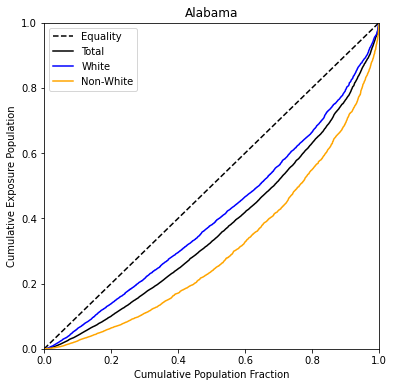

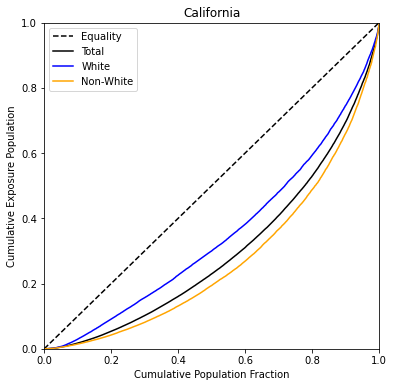

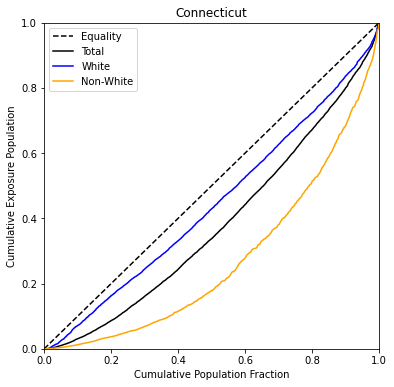

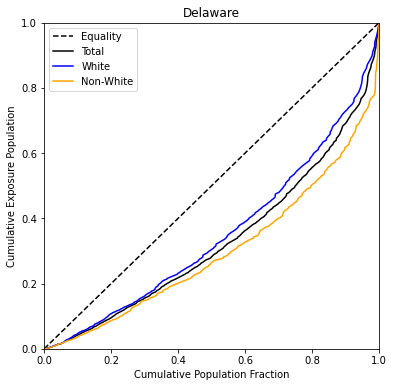

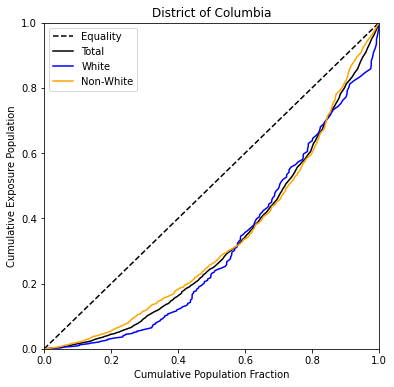

...

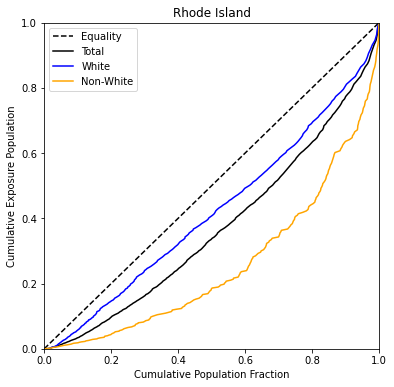

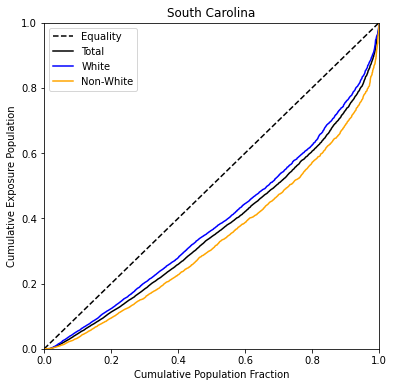

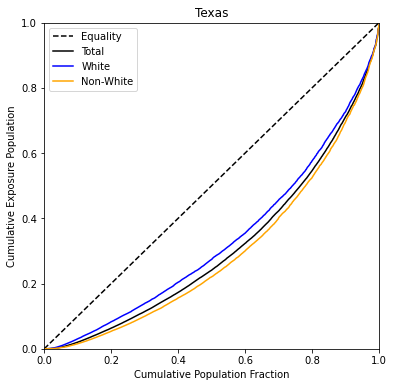

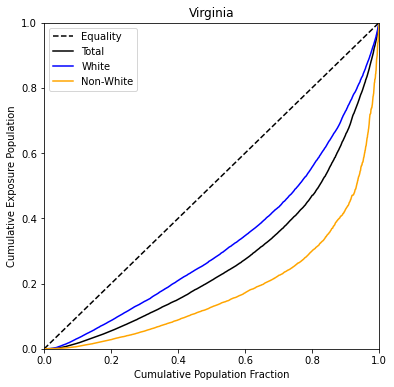

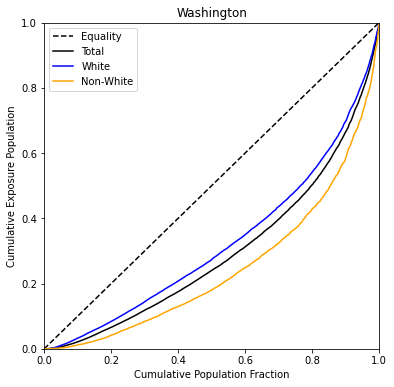

In [4]:
# lorenz curves
coastalstates = ['Alabama', 'California', 'Connecticut', 'Delaware', 'District of Columbia', 
                 'Florida', 'Georgia', 'Louisiana', 'Maine', 'Maryland', 
                 'Massachusetts', 'Mississippi', 'New Hampshire', 'New Jersey', 'New York', 
                 'North Carolina', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 
                 'Texas', 'Virginia', 'Washington']

for i in coastalstates:
    # start of calculations
    df_state = df_all[df_all['NAME'].str.endswith(i)]
    
    df_state_total = df_state[['GEOID','NAME','total','FFsum']]
    df_state_total = df_state_total.sort_values(by=['FFsum'],ascending=True) # weighted FF sum serves as the "exposure" value for sorting and analysis
    df_state_total['cum_pop'] = df_state_total['total'].cumsum()
    df_state_total['cum_FFsum'] = df_state_total['FFsum'].cumsum()
    df_state_total['normalized_pop'] = df_state_total['cum_pop']/df_state_total['total'].sum()
    df_state_total['normalized_FFsum'] = df_state_total['cum_FFsum']/df_state_total['FFsum'].sum()
    
    df_state_white = df_state[['GEOID','NAME','white','FFsum']]
    df_state_white = df_state_white.sort_values(by=['FFsum'],ascending=True)
    df_state_white['cum_pop'] = df_state_white['white'].cumsum()
    df_state_white['cum_FFsum'] = df_state_white['FFsum'].cumsum()
    df_state_white['normalized_pop'] = df_state_white['cum_pop']/df_state_white['white'].sum()
    df_state_white['normalized_FFsum'] = df_state_white['cum_FFsum']/df_state_white['FFsum'].sum()
    
    df_state_nonwhite = df_state[['GEOID','NAME','nonwhite','FFsum']]
    df_state_nonwhite = df_state_nonwhite.sort_values(by=['FFsum'],ascending=True)
    df_state_nonwhite['cum_pop'] = df_state_nonwhite['nonwhite'].cumsum()
    df_state_nonwhite['cum_FFsum'] = df_state_nonwhite['FFsum'].cumsum()
    df_state_nonwhite['normalized_pop'] = df_state_nonwhite['cum_pop']/df_state_nonwhite['nonwhite'].sum()
    df_state_nonwhite['normalized_FFsum'] = df_state_nonwhite['cum_FFsum']/df_state_nonwhite['FFsum'].sum()
    # end of calculations
    
    # start of plotting
    fig, ax = plt.subplots(figsize=(6,6))
    ax.set_title(i)
    
    x = np.arange(0, 1.1, 0.1) # equations to define eqaulity
    y = x
    
    ax.plot(x, y, color='black',linestyle='--')
    ax.plot(df_state_total['normalized_pop'],df_state_total['normalized_FFsum'],color='black',linestyle='-')
    ax.plot(df_state_white['normalized_pop'],df_state_white['normalized_FFsum'],color='blue',linestyle='-')
    ax.plot(df_state_nonwhite['normalized_pop'],df_state_nonwhite['normalized_FFsum'],color='orange',linestyle='-')
    
    ax.set_xlim(0,1)
    ax.set_ylim(0,1)
    ax.set_xlabel('Cumulative Population Fraction')
    ax.set_ylabel('Cumulative Exposure Population')
    ax.legend(['Equality','Total','White','Non-White'],loc=2)
    
    plt.savefig('results/LorenzCurves/CoastalStates/'+i, dpi=300, bbox_inches='tight')
    # end of plotting

In [3]:
# area under lorenz curves and Gini indices
coastalstates = ['Alabama', 'California', 'Connecticut', 'Delaware', 'District of Columbia', 
                 'Florida', 'Georgia', 'Louisiana', 'Maine', 'Maryland', 
                 'Massachusetts', 'Mississippi', 'New Hampshire', 'New Jersey', 'New York', 
                 'North Carolina', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 
                 'Texas', 'Virginia', 'Washington']

df_coastalstates_area = pd.DataFrame(columns=['State','poptotal','popwhite','popnonwhite','Atotal','Awhite','Anonwhite'])

df_coastalstates_Gini = pd.DataFrame(columns=['State','poptotal','popwhite','popnonwhite','Gini_total','Gini_white','Gini_nonwhite'])

for i in coastalstates:
    # start of calculations
    df_state = df_all[df_all['NAME'].str.endswith(i)]
    
    df_state_total = df_state[['GEOID','NAME','total','FFsum']]
    df_state_total = df_state_total.sort_values(by=['FFsum'],ascending=True) # weighted FF sum serves as the "exposure" value for sorting and analysis
    df_state_total['cum_pop'] = df_state_total['total'].cumsum()
    df_state_total['cum_FFsum'] = df_state_total['FFsum'].cumsum()
    df_state_total['normalized_pop'] = df_state_total['cum_pop']/df_state_total['total'].sum()
    df_state_total['normalized_FFsum'] = df_state_total['cum_FFsum']/df_state_total['FFsum'].sum()
    
    df_state_white = df_state[['GEOID','NAME','white','FFsum']]
    df_state_white = df_state_white.sort_values(by=['FFsum'],ascending=True)
    df_state_white['cum_pop'] = df_state_white['white'].cumsum()
    df_state_white['cum_FFsum'] = df_state_white['FFsum'].cumsum()
    df_state_white['normalized_pop'] = df_state_white['cum_pop']/df_state_white['white'].sum()
    df_state_white['normalized_FFsum'] = df_state_white['cum_FFsum']/df_state_white['FFsum'].sum()
    
    df_state_nonwhite = df_state[['GEOID','NAME','nonwhite','FFsum']]
    df_state_nonwhite = df_state_nonwhite.sort_values(by=['FFsum'],ascending=True)
    df_state_nonwhite['cum_pop'] = df_state_nonwhite['nonwhite'].cumsum()
    df_state_nonwhite['cum_FFsum'] = df_state_nonwhite['FFsum'].cumsum()
    df_state_nonwhite['normalized_pop'] = df_state_nonwhite['cum_pop']/df_state_nonwhite['nonwhite'].sum()
    df_state_nonwhite['normalized_FFsum'] = df_state_nonwhite['cum_FFsum']/df_state_nonwhite['FFsum'].sum()
    
    poptotal = df_state_total['total'].sum()
    popwhite = df_state_white['white'].sum()
    popnonwhite = df_state_nonwhite['nonwhite'].sum()
    
    area_total = np.trapz(df_state_total['normalized_FFsum'],df_state_total['normalized_pop'])
    area_white = np.trapz(df_state_white['normalized_FFsum'],df_state_white['normalized_pop'])
    area_nonwhite = np.trapz(df_state_nonwhite['normalized_FFsum'],df_state_nonwhite['normalized_pop'])
    
    Gini_total = (0.5 - np.trapz(df_state_total['normalized_FFsum'],df_state_total['normalized_pop']))/0.5
    Gini_white = (0.5 - np.trapz(df_state_white['normalized_FFsum'],df_state_white['normalized_pop']))/0.5
    Gini_nonwhite = (0.5 - np.trapz(df_state_nonwhite['normalized_FFsum'],df_state_nonwhite['normalized_pop']))/0.5
    # end of calculations
    
    # start of results synthesis
    df_coastalstates_area = df_coastalstates_area.append({'State':i,'poptotal':poptotal,'popwhite':popwhite,'popnonwhite':popnonwhite,'Atotal':area_total,'Awhite':area_white,'Anonwhite':area_nonwhite}, ignore_index=True)
    df_coastalstates_Gini = df_coastalstates_Gini.append({'State':i,'poptotal':poptotal,'popwhite':popwhite,'popnonwhite':popnonwhite,'Gini_total':Gini_total,'Gini_white':Gini_white,'Gini_nonwhite':Gini_nonwhite}, ignore_index=True)
    
df_coastalstates_area.to_csv('results/CoastalStates_Areas.csv', index=False)
df_coastalstates_Gini.to_csv('results/CoastalStates_Ginis.csv', index=False)
# end of results synthesis

## Coastal Counties

Coastal counties within states (including D.C.) in the contiguous U.S. according to NOAA Fisheries.

    https://www.fisheries.noaa.gov/inport/item/66112
    Includes AL and HI (NOT included in analysis)

In [4]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [5]:
df_coastalcounties = pd.read_csv('data/tract_coastalcounties.csv')
df_coastalcounties = df_coastalcounties.rename(columns={'pop_total':'total'})
df_coastalcounties = df_coastalcounties.dropna()
df_coastalcounties

,OID_,GEOID,NAME,total,white,nonwhite,FFsum,COUNTY
0,1,1003010100,"Census Tract 101, Baldwin County, Alabama",3745.0,2956.0,789.0,12724.0,"Baldwin County, Alabama"
1,2,1097000500,"Census Tract 5, Mobile County, Alabama",1487.0,10.0,1477.0,5910.0,"Mobile County, Alabama"
2,3,1097002700,"Census Tract 27, Mobile County, Alabama",2251.0,316.0,1935.0,3949.0,"Mobile County, Alabama"
3,4,1097004800,"Census Tract 48, Mobile County, Alabama",979.0,41.0,938.0,1506.0,"Mobile County, Alabama"
4,5,1097003205,"Census Tract 32.05, Mobile County, Alabama",2856.0,383.0,2473.0,1085.0,"Mobile County, Alabama"
...,...,...,...,...,...,...,...,...
27203,27794,53053070404,"Census Tract 704.04, Pierce County, Washington",6045.0,4579.0,1466.0,9646.0,"Pierce County, Washington"
27204,27795,53053070208,"Census Tract 702.08, Pierce County, Washington",7162.0,5340.0,1822.0,5868.0,"Pierce County, Washington"
27205,27796,53053070310,"Census Tract 703.10, Pierce County, Washington",5408.0,4075.0,1333.0,2587.0,"Pierce County, Washington"
27206,27797,53053070204,"Census Tract 702.04, Pierce County, Washington",3734.0,2916.0,818.0,2230.0,"Pierce County, Washington"


In [6]:
# refinement of data
df_coastalcounties_refinement = df_coastalcounties.groupby('COUNTY')['GEOID'].nunique()
df_coastalcounties_refinement = df_coastalcounties_refinement[df_coastalcounties_refinement > 2] # excludes counties that have less than 3 census tracts
df_coastalcounties_refined = pd.merge(left=df_coastalcounties, right=df_coastalcounties_refinement, how='right', on='COUNTY')
df_coastalcounties_refined = df_coastalcounties_refined.sort_values(by='OID_')
df_coastalcounties_refined

,OID_,GEOID_x,NAME,total,white,nonwhite,FFsum,COUNTY,GEOID_y
779,1,1003010100,"Census Tract 101, Baldwin County, Alabama",3745.0,2956.0,789.0,12724.0,"Baldwin County, Alabama",43
15474,2,1097000500,"Census Tract 5, Mobile County, Alabama",1487.0,10.0,1477.0,5910.0,"Mobile County, Alabama",135
15475,3,1097002700,"Census Tract 27, Mobile County, Alabama",2251.0,316.0,1935.0,3949.0,"Mobile County, Alabama",135
15476,4,1097004800,"Census Tract 48, Mobile County, Alabama",979.0,41.0,938.0,1506.0,"Mobile County, Alabama",135
15477,5,1097003205,"Census Tract 32.05, Mobile County, Alabama",2856.0,383.0,2473.0,1085.0,"Mobile County, Alabama",135
...,...,...,...,...,...,...,...,...,...
19898,27794,53053070404,"Census Tract 704.04, Pierce County, Washington",6045.0,4579.0,1466.0,9646.0,"Pierce County, Washington",193
19899,27795,53053070208,"Census Tract 702.08, Pierce County, Washington",7162.0,5340.0,1822.0,5868.0,"Pierce County, Washington",193
19900,27796,53053070310,"Census Tract 703.10, Pierce County, Washington",5408.0,4075.0,1333.0,2587.0,"Pierce County, Washington",193
19901,27797,53053070204,"Census Tract 702.04, Pierce County, Washington",3734.0,2916.0,818.0,2230.0,"Pierce County, Washington",193


C:\Program Files\ArcGIS\Pro\bin\Python\envs\arcgispro-py3\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


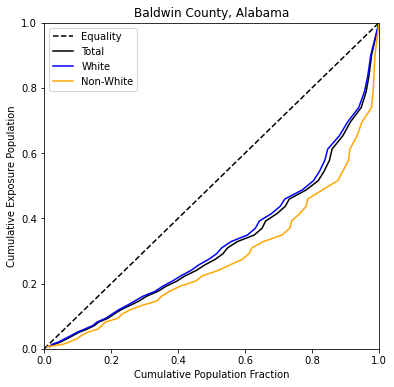

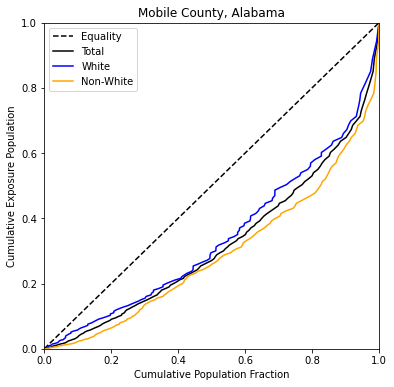

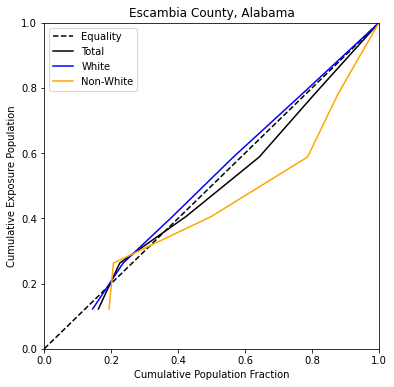

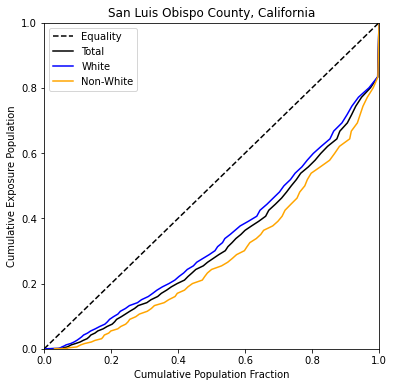

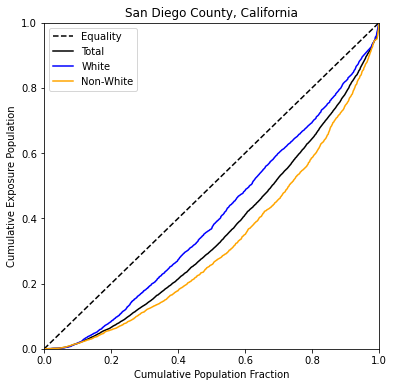

...

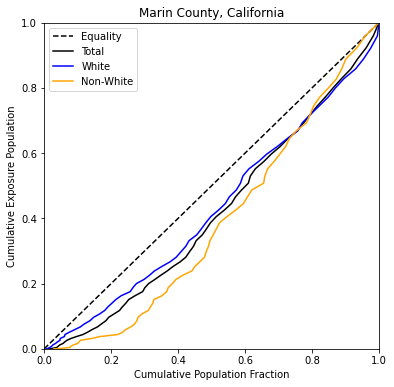

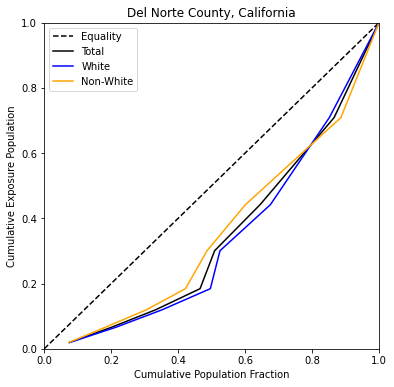

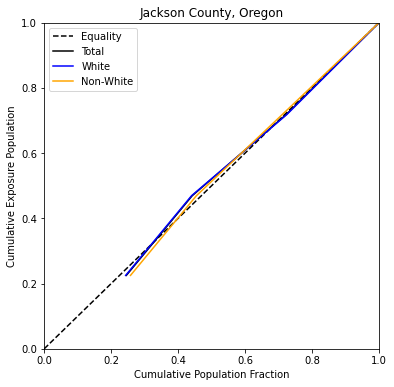

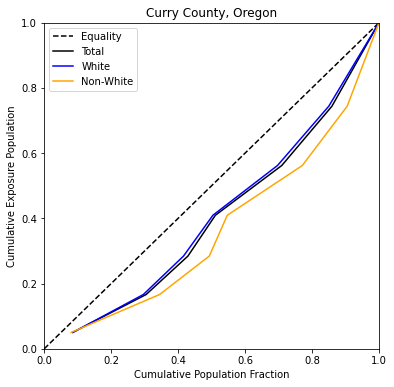

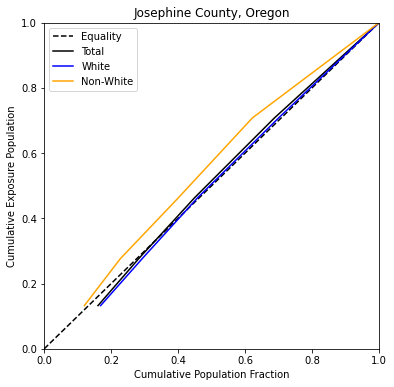

In [53]:
# lorenz curves
coastalcounties = df_coastalcounties_refined['COUNTY'].unique()

for i in coastalcounties:
    # start of calculations
    df_county = df_coastalcounties_refined[df_coastalcounties_refined['NAME'].str.endswith(i)]
    
    df_county_total = df_county[['GEOID_x','NAME','total','FFsum']]
    df_county_total = df_county_total.sort_values(by=['FFsum'],ascending=True) # weighted FF sum serves as the "exposure" value for sorting and analysis
    df_county_total['cum_pop'] = df_county_total['total'].cumsum()
    df_county_total['cum_FFsum'] = df_county_total['FFsum'].cumsum()
    df_county_total['normalized_pop'] = df_county_total['cum_pop']/df_county_total['total'].sum()
    df_county_total['normalized_FFsum'] = df_county_total['cum_FFsum']/df_county_total['FFsum'].sum()
    
    df_county_white = df_county[['GEOID_x','NAME','white','FFsum']]
    df_county_white = df_county_white.sort_values(by=['FFsum'],ascending=True)
    df_county_white['cum_pop'] = df_county_white['white'].cumsum()
    df_county_white['cum_FFsum'] = df_county_white['FFsum'].cumsum()
    df_county_white['normalized_pop'] = df_county_white['cum_pop']/df_county_white['white'].sum()
    df_county_white['normalized_FFsum'] = df_county_white['cum_FFsum']/df_county_white['FFsum'].sum()
    
    df_county_nonwhite = df_county[['GEOID_x','NAME','nonwhite','FFsum']]
    df_county_nonwhite = df_county_nonwhite.sort_values(by=['FFsum'],ascending=True)
    df_county_nonwhite['cum_pop'] = df_county_nonwhite['nonwhite'].cumsum()
    df_county_nonwhite['cum_FFsum'] = df_county_nonwhite['FFsum'].cumsum()
    df_county_nonwhite['normalized_pop'] = df_county_nonwhite['cum_pop']/df_county_nonwhite['nonwhite'].sum()
    df_county_nonwhite['normalized_FFsum'] = df_county_nonwhite['cum_FFsum']/df_county_nonwhite['FFsum'].sum()
    # end of calculations
    
    # start of plotting
    fig, ax = plt.subplots(figsize=(6,6))
    ax.set_title(i)
    
    x = np.arange(0, 1.1, 0.1) # equations to define eqaulity
    y = x
    
    ax.plot(x, y, color='black',linestyle='--')
    ax.plot(df_county_total['normalized_pop'],df_county_total['normalized_FFsum'],color='black',linestyle='-')
    ax.plot(df_county_white['normalized_pop'],df_county_white['normalized_FFsum'],color='blue',linestyle='-')
    ax.plot(df_county_nonwhite['normalized_pop'],df_county_nonwhite['normalized_FFsum'],color='orange',linestyle='-')
    
    ax.set_xlim(0,1)
    ax.set_ylim(0,1)
    ax.set_xlabel('Cumulative Population Fraction')
    ax.set_ylabel('Cumulative Exposure Population')
    ax.legend(['Equality','Total','White','Non-White'],loc=2)
    
    plt.savefig('results/LorenzCurves/CoastalCounties/'+i+'.png', dpi=300, bbox_inches='tight')
    # end of plotting

In [7]:
# area under lorenz curves and Gini indices
coastalcounties = df_coastalcounties_refined['COUNTY'].unique()

df_coastalcounties_area = pd.DataFrame(columns=['County','poptotal','popwhite','popnonwhite','Atotal','Awhite','Anonwhite'])

df_coastalcounties_Gini = pd.DataFrame(columns=['County','poptotal','popwhite','popnonwhite','Gini_total','Gini_white','Gini_nonwhite'])

for i in coastalcounties:
    # start of calculations
    df_county = df_coastalcounties_refined[df_coastalcounties_refined['NAME'].str.endswith(i)]
    
    df_county_total = df_county[['GEOID_x','NAME','total','FFsum']]
    df_county_total = df_county_total.sort_values(by=['FFsum'],ascending=True) # weighted FF sum serves as the "exposure" value for sorting and analysis
    df_county_total['cum_pop'] = df_county_total['total'].cumsum()
    df_county_total['cum_FFsum'] = df_county_total['FFsum'].cumsum()
    df_county_total['normalized_pop'] = df_county_total['cum_pop']/df_county_total['total'].sum()
    df_county_total['normalized_FFsum'] = df_county_total['cum_FFsum']/df_county_total['FFsum'].sum()
    
    df_county_white = df_county[['GEOID_x','NAME','white','FFsum']]
    df_county_white = df_county_white.sort_values(by=['FFsum'],ascending=True)
    df_county_white['cum_pop'] = df_county_white['white'].cumsum()
    df_county_white['cum_FFsum'] = df_county_white['FFsum'].cumsum()
    df_county_white['normalized_pop'] = df_county_white['cum_pop']/df_county_white['white'].sum()
    df_county_white['normalized_FFsum'] = df_county_white['cum_FFsum']/df_county_white['FFsum'].sum()
    
    df_county_nonwhite = df_county[['GEOID_x','NAME','nonwhite','FFsum']]
    df_county_nonwhite = df_county_nonwhite.sort_values(by=['FFsum'],ascending=True)
    df_county_nonwhite['cum_pop'] = df_county_nonwhite['nonwhite'].cumsum()
    df_county_nonwhite['cum_FFsum'] = df_county_nonwhite['FFsum'].cumsum()
    df_county_nonwhite['normalized_pop'] = df_county_nonwhite['cum_pop']/df_county_nonwhite['nonwhite'].sum()
    df_county_nonwhite['normalized_FFsum'] = df_county_nonwhite['cum_FFsum']/df_county_nonwhite['FFsum'].sum()
    
    poptotal = df_county_total['total'].sum()
    popwhite = df_county_white['white'].sum()
    popnonwhite = df_county_nonwhite['nonwhite'].sum()
    
    area_total = np.trapz(df_county_total['normalized_FFsum'],df_county_total['normalized_pop'])
    area_white = np.trapz(df_county_white['normalized_FFsum'],df_county_white['normalized_pop'])
    area_nonwhite = np.trapz(df_county_nonwhite['normalized_FFsum'],df_county_nonwhite['normalized_pop'])
    
    Gini_total = (0.5 - np.trapz(df_county_total['normalized_FFsum'],df_county_total['normalized_pop']))/0.5
    Gini_white = (0.5 - np.trapz(df_county_white['normalized_FFsum'],df_county_white['normalized_pop']))/0.5
    Gini_nonwhite = (0.5 - np.trapz(df_county_nonwhite['normalized_FFsum'],df_county_nonwhite['normalized_pop']))/0.5
    # end of calculations
    
    # start of results synthesis
    df_coastalcounties_area = df_coastalcounties_area.append({'County':i,'poptotal':poptotal,'popwhite':popwhite,'popnonwhite':popnonwhite,'Atotal':area_total,'Awhite':area_white,'Anonwhite':area_nonwhite}, ignore_index=True)
    df_coastalcounties_Gini = df_coastalcounties_Gini.append({'County':i,'poptotal':poptotal,'popwhite':popwhite,'popnonwhite':popnonwhite,'Gini_total':Gini_total,'Gini_white':Gini_white,'Gini_nonwhite':Gini_nonwhite}, ignore_index=True)
    
df_coastalcounties_area.to_csv('results/CoastalCounties_Areas.csv', index=False)
df_coastalcounties_Gini.to_csv('results/CoastalCounties_Ginis.csv', index=False)
# end of results synthesis

## Coastal States (ONLY Coastal Counties/Tracts)

States (including D.C.) in the contiguous U.S. containing coastal counties according to NOAA Fisheries. Analysis based only on tracts contained within those coastal counties.

    https://www.fisheries.noaa.gov/inport/item/66112
    Includes AL and HI (NOT included in analysis)

In [8]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [9]:
df_coastalcounties = pd.read_csv('data/tract_coastalcounties.csv')
df_coastalcounties = df_coastalcounties.rename(columns={'pop_total':'total'})
df_coastalcounties = df_coastalcounties.dropna()
df_coastalcounties

,OID_,GEOID,NAME,total,white,nonwhite,FFsum,COUNTY
0,1,1003010100,"Census Tract 101, Baldwin County, Alabama",3745.0,2956.0,789.0,12724.0,"Baldwin County, Alabama"
1,2,1097000500,"Census Tract 5, Mobile County, Alabama",1487.0,10.0,1477.0,5910.0,"Mobile County, Alabama"
2,3,1097002700,"Census Tract 27, Mobile County, Alabama",2251.0,316.0,1935.0,3949.0,"Mobile County, Alabama"
3,4,1097004800,"Census Tract 48, Mobile County, Alabama",979.0,41.0,938.0,1506.0,"Mobile County, Alabama"
4,5,1097003205,"Census Tract 32.05, Mobile County, Alabama",2856.0,383.0,2473.0,1085.0,"Mobile County, Alabama"
...,...,...,...,...,...,...,...,...
27203,27794,53053070404,"Census Tract 704.04, Pierce County, Washington",6045.0,4579.0,1466.0,9646.0,"Pierce County, Washington"
27204,27795,53053070208,"Census Tract 702.08, Pierce County, Washington",7162.0,5340.0,1822.0,5868.0,"Pierce County, Washington"
27205,27796,53053070310,"Census Tract 703.10, Pierce County, Washington",5408.0,4075.0,1333.0,2587.0,"Pierce County, Washington"
27206,27797,53053070204,"Census Tract 702.04, Pierce County, Washington",3734.0,2916.0,818.0,2230.0,"Pierce County, Washington"


C:\Program Files\ArcGIS\Pro\bin\Python\envs\arcgispro-py3\lib\site-packages\ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


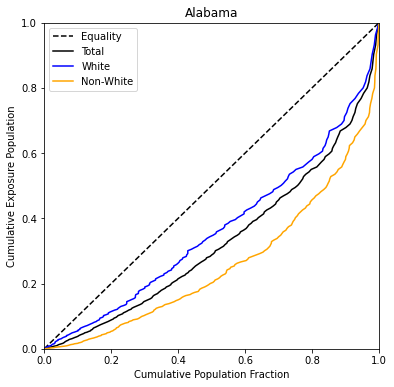

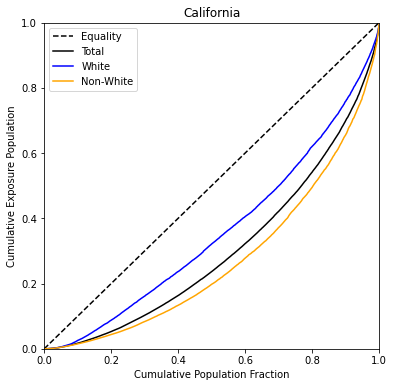

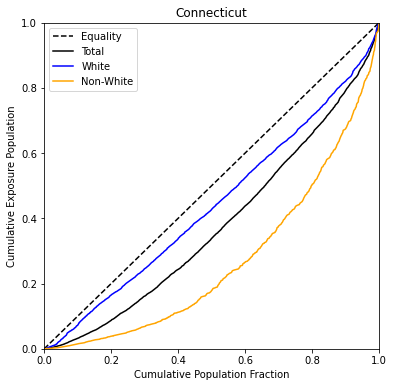

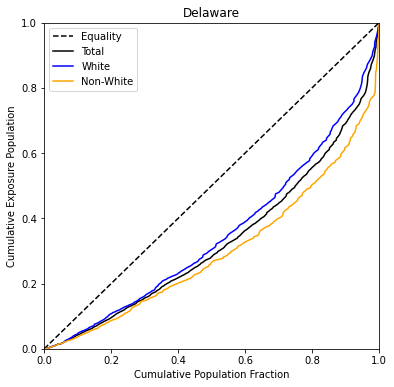

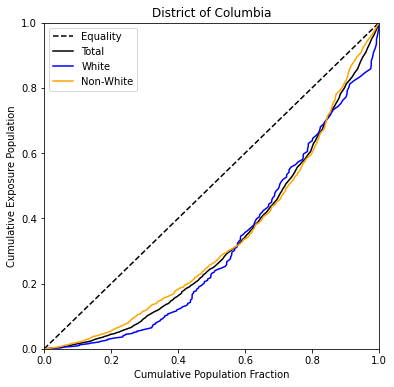

...

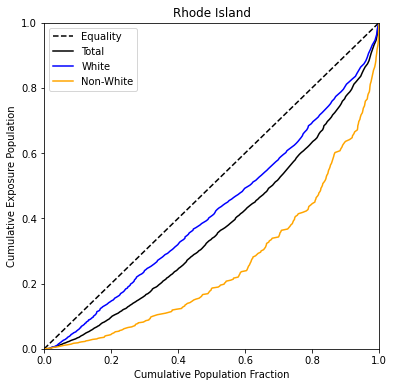

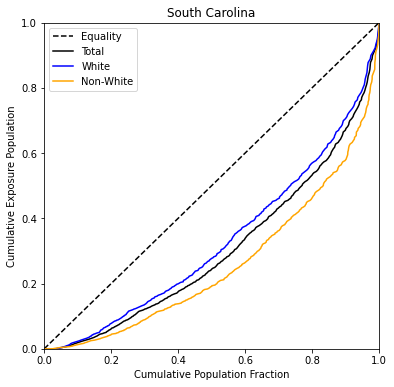

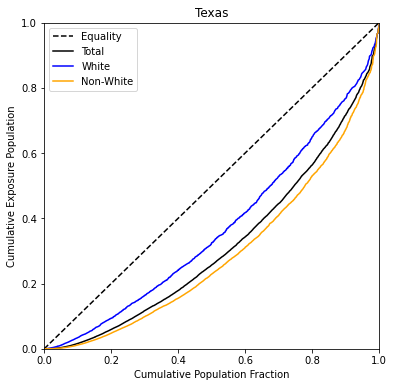

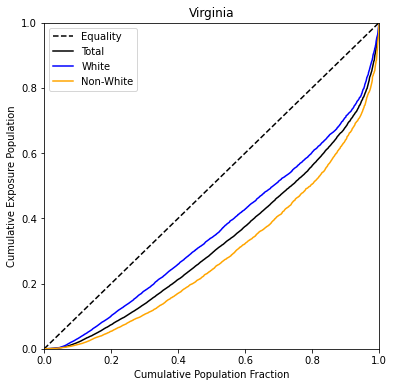

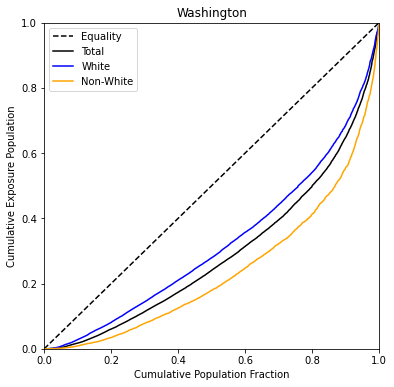

In [3]:
# lorenz curves
coastalstates = ['Alabama', 'California', 'Connecticut', 'Delaware', 'District of Columbia', 
                 'Florida', 'Georgia', 'Louisiana', 'Maine', 'Maryland', 
                 'Massachusetts', 'Mississippi', 'New Hampshire', 'New Jersey', 'New York', 
                 'North Carolina', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 
                 'Texas', 'Virginia', 'Washington']

for i in coastalstates:
    # start of calculations
    df_state = df_coastalcounties[df_coastalcounties['NAME'].str.endswith(i)]
    
    df_state_total = df_state[['GEOID','NAME','total','FFsum']]
    df_state_total = df_state_total.sort_values(by=['FFsum'],ascending=True) # weighted FF sum serves as the "exposure" value for sorting and analysis
    df_state_total['cum_pop'] = df_state_total['total'].cumsum()
    df_state_total['cum_FFsum'] = df_state_total['FFsum'].cumsum()
    df_state_total['normalized_pop'] = df_state_total['cum_pop']/df_state_total['total'].sum()
    df_state_total['normalized_FFsum'] = df_state_total['cum_FFsum']/df_state_total['FFsum'].sum()
    
    df_state_white = df_state[['GEOID','NAME','white','FFsum']]
    df_state_white = df_state_white.sort_values(by=['FFsum'],ascending=True)
    df_state_white['cum_pop'] = df_state_white['white'].cumsum()
    df_state_white['cum_FFsum'] = df_state_white['FFsum'].cumsum()
    df_state_white['normalized_pop'] = df_state_white['cum_pop']/df_state_white['white'].sum()
    df_state_white['normalized_FFsum'] = df_state_white['cum_FFsum']/df_state_white['FFsum'].sum()
    
    df_state_nonwhite = df_state[['GEOID','NAME','nonwhite','FFsum']]
    df_state_nonwhite = df_state_nonwhite.sort_values(by=['FFsum'],ascending=True)
    df_state_nonwhite['cum_pop'] = df_state_nonwhite['nonwhite'].cumsum()
    df_state_nonwhite['cum_FFsum'] = df_state_nonwhite['FFsum'].cumsum()
    df_state_nonwhite['normalized_pop'] = df_state_nonwhite['cum_pop']/df_state_nonwhite['nonwhite'].sum()
    df_state_nonwhite['normalized_FFsum'] = df_state_nonwhite['cum_FFsum']/df_state_nonwhite['FFsum'].sum()
    # end of calculations
    
    # start of plotting
    fig, ax = plt.subplots(figsize=(6,6))
    ax.set_title(i)
    
    x = np.arange(0, 1.1, 0.1) # equations to define eqaulity
    y = x
    
    ax.plot(x, y, color='black',linestyle='--')
    ax.plot(df_state_total['normalized_pop'],df_state_total['normalized_FFsum'],color='black',linestyle='-')
    ax.plot(df_state_white['normalized_pop'],df_state_white['normalized_FFsum'],color='blue',linestyle='-')
    ax.plot(df_state_nonwhite['normalized_pop'],df_state_nonwhite['normalized_FFsum'],color='orange',linestyle='-')
    
    ax.set_xlim(0,1)
    ax.set_ylim(0,1)
    ax.set_xlabel('Cumulative Population Fraction')
    ax.set_ylabel('Cumulative Exposure Population')
    ax.legend(['Equality','Total','White','Non-White'],loc=2)
    
    plt.savefig('results/LorenzCurves/CoastalStates_CC/'+i, dpi=300, bbox_inches='tight')
    # end of plotting

In [11]:
# area under lorenz curves and Gini indices
coastalstates = ['Alabama', 'California', 'Connecticut', 'Delaware', 'District of Columbia', 
                 'Florida', 'Georgia', 'Louisiana', 'Maine', 'Maryland', 
                 'Massachusetts', 'Mississippi', 'New Hampshire', 'New Jersey', 'New York', 
                 'North Carolina', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 
                 'Texas', 'Virginia', 'Washington']

df_coastalstates_CC_area = pd.DataFrame(columns=['State','poptotal','popwhite','popnonwhite','Atotal','Awhite','Anonwhite'])

df_coastalstates_CC_Gini = pd.DataFrame(columns=['State','poptotal','popwhite','popnonwhite','Gini_total','Gini_white','Gini_nonwhite'])

for i in coastalstates:
    # start of calculations
    df_state = df_coastalcounties[df_coastalcounties['NAME'].str.endswith(i)]
    
    df_state_total = df_state[['GEOID','NAME','total','FFsum']]
    df_state_total = df_state_total.sort_values(by=['FFsum'],ascending=True) # weighted FF sum serves as the "exposure" value for sorting and analysis
    df_state_total['cum_pop'] = df_state_total['total'].cumsum()
    df_state_total['cum_FFsum'] = df_state_total['FFsum'].cumsum()
    df_state_total['normalized_pop'] = df_state_total['cum_pop']/df_state_total['total'].sum()
    df_state_total['normalized_FFsum'] = df_state_total['cum_FFsum']/df_state_total['FFsum'].sum()
    
    df_state_white = df_state[['GEOID','NAME','white','FFsum']]
    df_state_white = df_state_white.sort_values(by=['FFsum'],ascending=True)
    df_state_white['cum_pop'] = df_state_white['white'].cumsum()
    df_state_white['cum_FFsum'] = df_state_white['FFsum'].cumsum()
    df_state_white['normalized_pop'] = df_state_white['cum_pop']/df_state_white['white'].sum()
    df_state_white['normalized_FFsum'] = df_state_white['cum_FFsum']/df_state_white['FFsum'].sum()
    
    df_state_nonwhite = df_state[['GEOID','NAME','nonwhite','FFsum']]
    df_state_nonwhite = df_state_nonwhite.sort_values(by=['FFsum'],ascending=True)
    df_state_nonwhite['cum_pop'] = df_state_nonwhite['nonwhite'].cumsum()
    df_state_nonwhite['cum_FFsum'] = df_state_nonwhite['FFsum'].cumsum()
    df_state_nonwhite['normalized_pop'] = df_state_nonwhite['cum_pop']/df_state_nonwhite['nonwhite'].sum()
    df_state_nonwhite['normalized_FFsum'] = df_state_nonwhite['cum_FFsum']/df_state_nonwhite['FFsum'].sum()
    
    poptotal = df_state_total['total'].sum()
    popwhite = df_state_white['white'].sum()
    popnonwhite = df_state_nonwhite['nonwhite'].sum()
    
    area_total = np.trapz(df_state_total['normalized_FFsum'],df_state_total['normalized_pop'])
    area_white = np.trapz(df_state_white['normalized_FFsum'],df_state_white['normalized_pop'])
    area_nonwhite = np.trapz(df_state_nonwhite['normalized_FFsum'],df_state_nonwhite['normalized_pop'])
    
    Gini_total = (0.5 - np.trapz(df_state_total['normalized_FFsum'],df_state_total['normalized_pop']))/0.5
    Gini_white = (0.5 - np.trapz(df_state_white['normalized_FFsum'],df_state_white['normalized_pop']))/0.5
    Gini_nonwhite = (0.5 - np.trapz(df_state_nonwhite['normalized_FFsum'],df_state_nonwhite['normalized_pop']))/0.5
    # end of calculations
    
    # start of results synthesis
    df_coastalstates_CC_area = df_coastalstates_CC_area.append({'State':i,'poptotal':poptotal,'popwhite':popwhite,'popnonwhite':popnonwhite,'Atotal':area_total,'Awhite':area_white,'Anonwhite':area_nonwhite}, ignore_index=True)
    df_coastalstates_CC_Gini = df_coastalstates_CC_Gini.append({'State':i,'poptotal':poptotal,'popwhite':popwhite,'popnonwhite':popnonwhite,'Gini_total':Gini_total,'Gini_white':Gini_white,'Gini_nonwhite':Gini_nonwhite}, ignore_index=True)
    
df_coastalstates_CC_area.to_csv('results/CoastalStates_CC_Areas.csv', index=False)
df_coastalstates_CC_Gini.to_csv('results/CoastalStates_CC_Ginis.csv', index=False)
# end of results synthesis